# 3. Image Stitching

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

### need to install opencv-contrib-python

## run following command on your terminal
!pip install opencv-contrib-python==3.4.2.17

from google.colab import drive
drive.mount('/content/drive')

path = '/content/drive/My Drive/ecse415/Assignments/a2/images/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 3.1. SIFT keypoints and corresponding descriptors

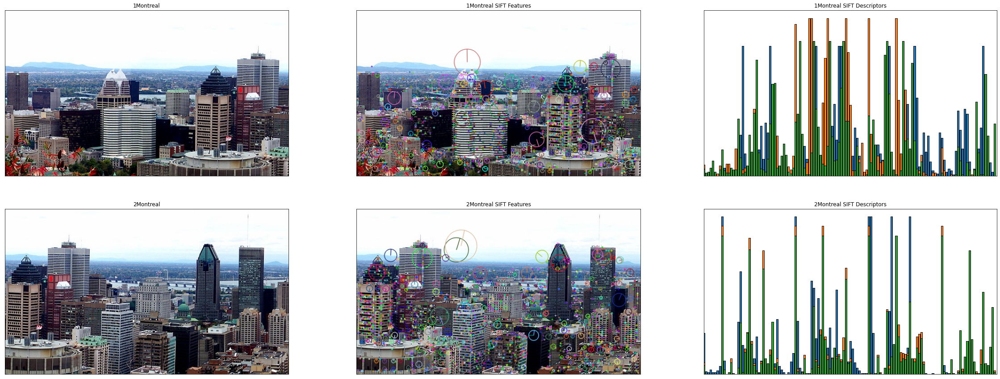

In [ ]:
# Compute SIFT keypoints and corresponding descriptors for images 1Montreal and 2Montreal.
# --

mtl1_img = cv2.imread(path+"1Montreal.jpg")
mtl2_img = cv2.imread(path+"2Montreal.jpg")

mtl1_img = cv2.cvtColor(mtl1_img, cv2.COLOR_BGR2RGB)
mtl2_img = cv2.cvtColor(mtl2_img, cv2.COLOR_BGR2RGB)

mtl1_img_disp = mtl1_img.copy()
mtl2_img_disp = mtl2_img.copy()

# Compute keypoints and descriptors
sift_obj = cv2.xfeatures2d.SIFT_create()

keypoints_l, descriptors_l = sift_obj.detectAndCompute(mtl1_img, None)
keypoints_r, descriptors_r = sift_obj.detectAndCompute(mtl2_img, None)

# draw the keypoints
cv2.drawKeypoints(mtl1_img, keypoints_l, mtl1_img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(mtl2_img, keypoints_r, mtl2_img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display SIFT features and descriptors
plt.figure(figsize=(40,15))
plt.subplot(231), plt.imshow(mtl1_img)
plt.title("1Montreal"), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(mtl1_img_disp)
plt.title("1Montreal SIFT Features"), plt.xticks([]), plt.yticks([])
plt.subplot(233)
# plot a couple of 1x128 SIFT descriptors
for i in range(3):
    # plot the 128x1 np array using matplotlib plot()
    # plt.plot(descriptors[i], marker='o', linestyle='-')
    plt.bar(np.arange(0,128),descriptors_l[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
plt.title("1Montreal SIFT Descriptors"), plt.xticks([]), plt.yticks([])

plt.subplot(234), plt.imshow(mtl2_img)
plt.title("2Montreal"), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(mtl2_img_disp)
plt.title("2Montreal SIFT Features"), plt.xticks([]), plt.yticks([])
plt.subplot(236)
# plot a couple of 1x128 SIFT descriptors
for i in range(3):
    # plot the 128x1 np array using matplotlib plot()
    # plt.plot(descriptors[i], marker='o', linestyle='-')
    plt.bar(np.arange(0,128),descriptors_r[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
plt.title("2Montreal SIFT Descriptors"), plt.xticks([]), plt.yticks([])
plt.show()


# --
# done

## 3.2. Matching keypoints

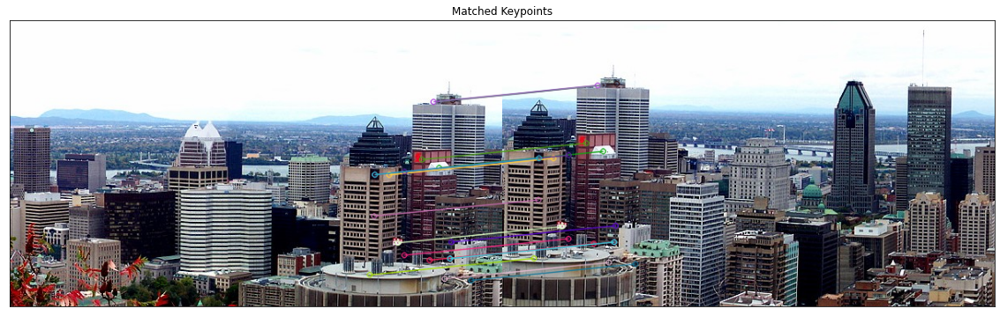

In [ ]:
# Find matching keypoints in 1Montreal and 2Montreal images and display
# the 20 best pairs.
# --

# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors_l,descriptors_r) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints 
imgmatch = cv2.drawMatches(mtl1_img,keypoints_l,mtl2_img,keypoints_r, matches[:20], None, flags=2)


plt.figure(figsize=(20,20))
plt.subplot(211)
plt.imshow(imgmatch)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

# --
# done

## 3.3. Homography using the RANSAC method and applying the transformation

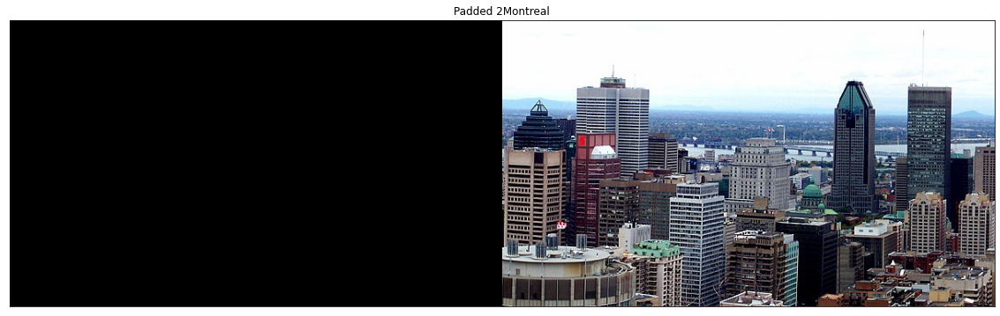

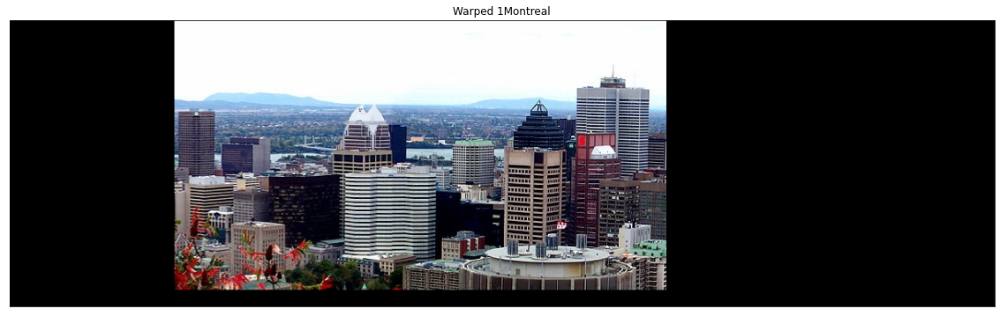

In [ ]:
# Find homography using the RANSAC method and apply the transformation to 1Montreal. Image 2Montreal should not be transformed. 
# --

# 2Montreal Padding
pad_mtl2_img = np.pad(mtl2_img, pad_width=[(0, 0),(mtl1_img.shape[1], 0),(0, 0)], mode='constant', constant_values=0)

# Compute keypoints and descriptors
sift_obj = cv2.xfeatures2d.SIFT_create()
keypoints_l, descriptors_l = sift_obj.detectAndCompute(mtl1_img, None)
keypoints_r, descriptors_r = sift_obj.detectAndCompute(pad_mtl2_img, None)

# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors_l,descriptors_r) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints 
imgmatch = cv2.drawMatches(mtl1_img,keypoints_l,pad_mtl2_img,keypoints_r, matches[:20], None, flags=2)

# Arrange matching keypoints in two separate lists
GoodMatches = []
for i, m in enumerate(matches):
    if m.distance < 1000: # threshold <-- hyperparameter
        GoodMatches.append((m.trainIdx, m.queryIdx))

mpl = np.float32([keypoints_l[i].pt for (__, i) in GoodMatches])
mpr = np.float32([keypoints_r[i].pt for (i, __) in GoodMatches])

# find homography
H, __ = cv2.findHomography(mpl, mpr, cv2.RANSAC, 4)

wimg = cv2.warpPerspective(mtl1_img, H, (pad_mtl2_img.shape[1],mtl2_img.shape[0]))
warped = wimg.copy()
wimg[:,wimg.shape[1] - mtl2_img.shape[1]:,:] = mtl2_img

plt.figure(figsize=(20,20))
plt.subplot(212)
plt.imshow(pad_mtl2_img)
plt.title("Padded 2Montreal"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(20,20))
plt.subplot(212)
plt.imshow(warped)
plt.title("Warped 1Montreal"), plt.xticks([]), plt.yticks([])
plt.show()



## 3.4. Stitching using Linear Image Blending

Shape of stitched image:  (350, 1200, 3)
warped right boundary_j:  800
pad_mtl2_img shape:  (350, 1200, 3)
mtl2_img shape:  (350, 600, 3)
warped shape:  (350, 1200, 3)
warped_bottom_boundary_i:  329


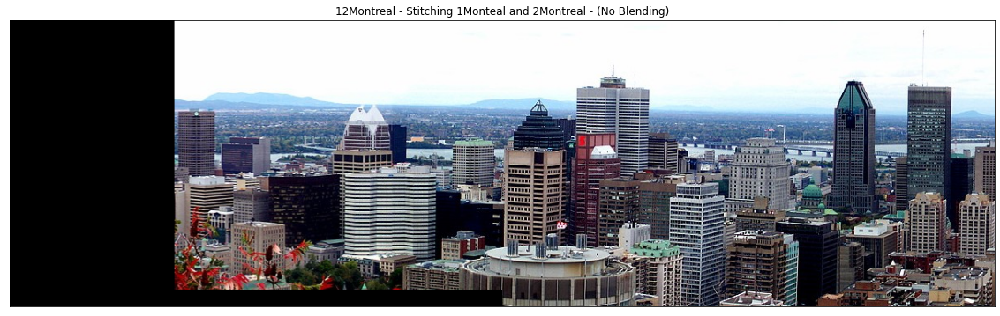

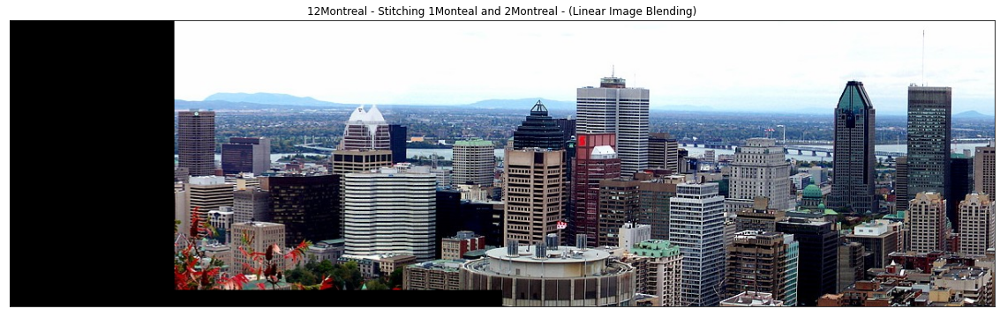

In [ ]:
# Stitch transformed 1Montreal and the original 2Montreal together using linear image blending. 

wimg = cv2.warpPerspective(mtl1_img, H, (pad_mtl2_img.shape[1],mtl2_img.shape[0]))
warped = wimg.copy()
wimg[:,wimg.shape[1] - mtl2_img.shape[1]:,:] = mtl2_img
print("Shape of stitched image: ", wimg.shape)

# Simple Linear Image Blending
# To implement Simple Linear Image Blending, I followed: https://docs.opencv.org/3.4/d5/dc4/tutorial_adding_images.html
# This was also referenced by Eric (Teaching Assistant) in the Discussion Board.


# Find right boundary of warped image
def warped_right_edge():  
  # Now Traverse through image using two for loops
  for i in range(0,1): # Height
    for j in range(warped.shape[1] - 1,-1, -1): 
      if not np.array_equal(warped[i,j], [0,0,0]):
        return (i,j)

warped_right_boundary_i,warped_right_boundary_j = warped_right_edge() # (0,800)
print("warped right boundary_j: ", warped_right_boundary_j) # j = 800 (column)
print("pad_mtl2_img shape: ", pad_mtl2_img.shape) # (350, 1200, 3)
print("mtl2_img shape: ", mtl2_img.shape) # (350, 600, 3)
print("warped shape: ",warped.shape)  # (350, 1200, 3)
#  Therefore leftmost boundary of 2Montreal is where j = 600
# Therefore overlapping of warped image and padded 2Montreal is from j =  600 to 800

# Find bottom boundary of warped image
def warped_bottom_boundary():  
  # Now Traverse through image using two for loops
  for i in range(warped.shape[0] - 1, -1, -1): # Height
    for j in range(warped.shape[1] // 2 - 1, warped.shape[1] // 2 - 10, -1): # Width
      if not np.array_equal(warped[i,j], [0,0,0]):
        return (i,j)

warped_bottom_boundary_i, warped_bottom_boundary_j = warped_bottom_boundary()
print("warped_bottom_boundary_i: ", warped_bottom_boundary_i) # i = 329 (row)
# Therefore overlapping of warped image and padded 2Montreal is from i = 0 to i = 329

# warped image values at j = 800 are nearly 0, therefore I have chosen 799 as the max value of j, instead of 800
img_blend = wimg.copy()
img_blend[0:330,600:800] = 0
alpha = 0.5
beta = 1.0 - alpha
blend = cv2.addWeighted(warped[0:330,600:800],alpha, pad_mtl2_img[0:330,600:800], beta, 0.0)
img_blend[0:330,600:800] = blend

plt.figure(figsize=(20,20))
plt.subplot(212)
plt.imshow(wimg)
plt.title("12Montreal - Stitching 1Monteal and 2Montreal - (No Blending)"), plt.xticks([]), plt.yticks([])


plt.figure(figsize=(20,20))
plt.subplot(212)
plt.imshow(img_blend)
plt.title("12Montreal - Stitching 1Monteal and 2Montreal - (Linear Image Blending)"), plt.xticks([]), plt.yticks([])
plt.show()


## 3.5. SIFT keypoints and descriptors for 12Montreal and 3Montreal

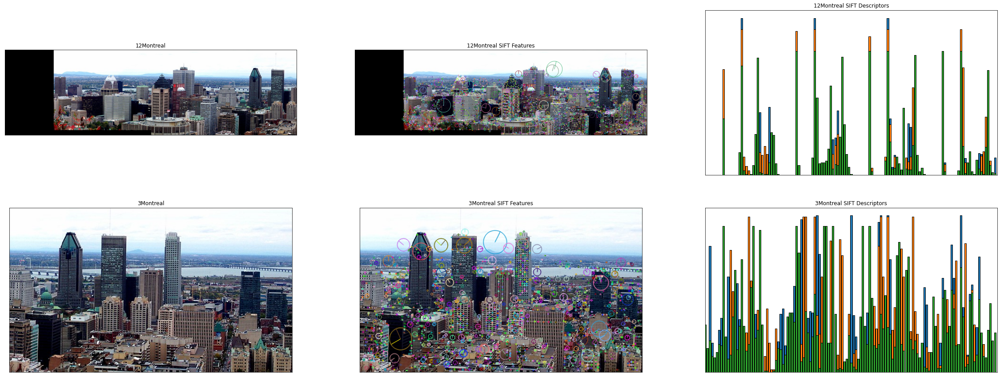

In [ ]:
# Compute SIFT keypoints and corresponding descriptors for images 12Montreal and 3Montreal. 


mtl12_img = img_blend
mtl3_img = cv2.imread(path+"3Montreal.jpg")

mtl3_img = cv2.cvtColor(mtl3_img, cv2.COLOR_BGR2RGB)

mtl12_img_disp = mtl12_img.copy()
mtl3_img_disp = mtl3_img.copy()

# Compute keypoints and descriptors
sift_obj = cv2.xfeatures2d.SIFT_create()

keypoints_l, descriptors_l = sift_obj.detectAndCompute(mtl12_img, None)
keypoints_r, descriptors_r = sift_obj.detectAndCompute(mtl3_img, None)

# draw the keypoints
cv2.drawKeypoints(mtl12_img, keypoints_l, mtl12_img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(mtl3_img, keypoints_r, mtl3_img_disp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display SIFT features and descriptors
plt.figure(figsize=(40,15))
plt.subplot(231), plt.imshow(mtl12_img)
plt.title("12Montreal"), plt.xticks([]), plt.yticks([])
plt.subplot(232), plt.imshow(mtl12_img_disp)
plt.title("12Montreal SIFT Features"), plt.xticks([]), plt.yticks([])
plt.subplot(233)
# plot a couple of 1x128 SIFT descriptors
for i in range(3):
    # plot the 128x1 np array using matplotlib plot()
    # plt.plot(descriptors[i], marker='o', linestyle='-')
    plt.bar(np.arange(0,128),descriptors_l[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
plt.title("12Montreal SIFT Descriptors"), plt.xticks([]), plt.yticks([])

plt.subplot(234), plt.imshow(mtl3_img)
plt.title("3Montreal"), plt.xticks([]), plt.yticks([])
plt.subplot(235), plt.imshow(mtl3_img_disp)
plt.title("3Montreal SIFT Features"), plt.xticks([]), plt.yticks([])
plt.subplot(236)
# plot a couple of 1x128 SIFT descriptors
for i in range(3):
    # plot the 128x1 np array using matplotlib plot()
    # plt.plot(descriptors[i], marker='o', linestyle='-')
    plt.bar(np.arange(0,128),descriptors_r[i], edgecolor='k' )
    plt.xlim([0,128]) # set x-axis limit
plt.title("3Montreal SIFT Descriptors"), plt.xticks([]), plt.yticks([])
plt.show()

## 3.6.  Matching keypoints

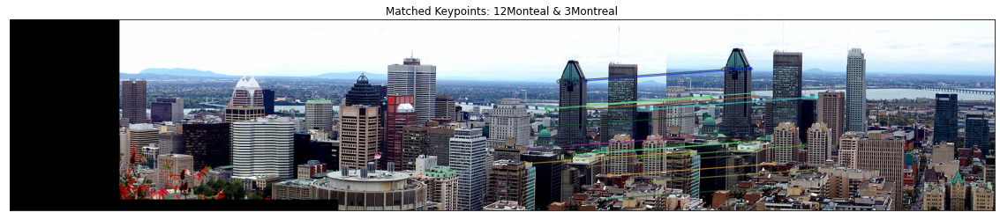

In [ ]:
# Find matching keypoints in 12Montreal and 3Montreal images and display
# the 20 best pairs.
# --

# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors_l,descriptors_r) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints 
imgmatch = cv2.drawMatches(mtl12_img,keypoints_l,mtl3_img,keypoints_r, matches[:20], None, flags=2)


plt.figure(figsize=(20,20))
plt.subplot(211)
plt.imshow(imgmatch)
plt.title("Matched Keypoints: 12Monteal & 3Montreal"), plt.xticks([]), plt.yticks([])
plt.show()

# --
# Done

## 3.7. Homography using the RANSAC method and applying the transformation

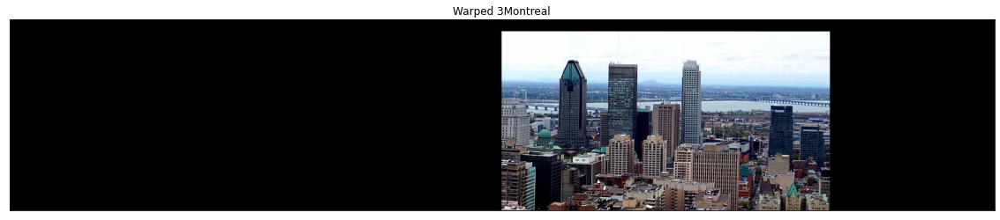

In [ ]:
# Find homography using the RANSAC method and apply the transformation to 1Montreal. Transform 12Montreal should not be tranformed
# --

# Compute keypoints and descriptors
sift_obj = cv2.xfeatures2d.SIFT_create()
keypoints_l, descriptors_l = sift_obj.detectAndCompute(mtl12_img, None)
keypoints_r, descriptors_r = sift_obj.detectAndCompute(mtl3_img, None)

# create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors.
matches = bf.match(descriptors_l,descriptors_r) # query image, train image

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints 
imgmatch = cv2.drawMatches(mtl12_img,keypoints_l,mtl3_img,keypoints_r, matches[:20], None, flags=2)

# Arrange matching keypoints in two separate lists
GoodMatches = []
for i, m in enumerate(matches):
    if m.distance < 1000: # threshold <-- hyperparameter
        GoodMatches.append((m.trainIdx, m.queryIdx))

mpl = np.float32([keypoints_l[i].pt for (__, i) in GoodMatches])
mpr = np.float32([keypoints_r[i].pt for (i, __) in GoodMatches])

# find homography
H, __ = cv2.findHomography(mpr, mpl, cv2.RANSAC, 4)

wimg = cv2.warpPerspective(mtl3_img, H, (mtl3_img.shape[1] + mtl12_img.shape[1],mtl3_img.shape[0]))
warped = wimg.copy()

plt.figure(figsize=(20,20))
plt.subplot(212)
plt.imshow(warped)
plt.title("Warped 3Montreal"), plt.xticks([]), plt.yticks([])
plt.show()

# --
# Done

## 3.8. Stitching using Linear Image Blending

Shape of 12Montreal:  (350, 1200, 3)
Shape of warped 3Montreal:  (350, 1800, 3)
Shape of stitched image:  (350, 1800, 3)
warped_left_boundary_j :  898
warped_top_boundary_i:  21


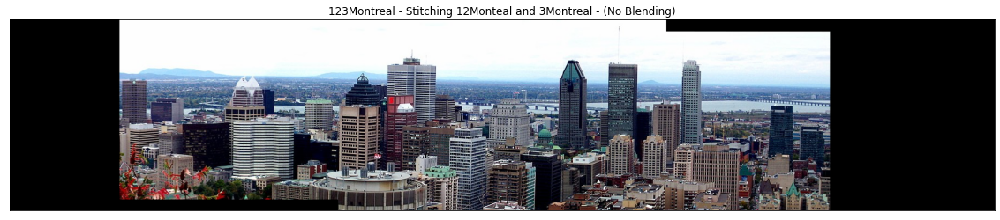

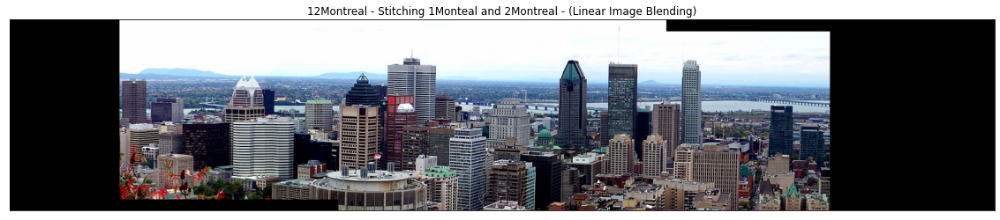

In [ ]:
# Stitch original 12Montreal and transformed 3Montreal together using linear image blending. 

wimg[:,: mtl12_img.shape[1],:] = mtl12_img
print("Shape of 12Montreal: ", mtl12_img.shape)
print("Shape of warped 3Montreal: ", warped.shape)
print("Shape of stitched image: ", wimg.shape)

# Simple Linear Image Blending
# To implement Simple Linear Image Blending, I followed: https://docs.opencv.org/3.4/d5/dc4/tutorial_adding_images.html
# This was also referenced by Eric (Teaching Assistant) in the Discussion Board.


# Find left boundary of warped image
def warped_left_boundary():  
  # Now Traverse through image using two for loops
  for i in range(warped.shape[0] - 1,warped.shape[0] - 11 , -1 ): # Height
    for j in range(0, warped.shape[1]): 
      if not np.array_equal(warped[i,j], [0,0,0]):
        return (i,j)

warped_left_boundary_i,warped_left_boundary_j = warped_left_boundary()
print("warped_left_boundary_j : ", warped_left_boundary_j) # j = 898 (column)
#  Leftmost boundary of warped 3Montreal is where j = 898
# We know rightmost boundary of 12Montreal is at pixel num 1200, j = 1199
# Therefore overlapping of warped 3Montreal and 12Montreal is from j =  898 to 1199

# # Find top boundary of warped image
def warped_top_boundary():  
  # Now Traverse through image using two for loops
  for i in range(0, warped.shape[0]): # Height
    for j in range(mtl12_img.shape[1] , mtl12_img.shape[1] + 10): # Width
      if not np.array_equal(warped[i,j], [0,0,0]):
        return (i,j)

warped_top_boundary_i, warped_top_boundary_j = warped_top_boundary()
print("warped_top_boundary_i: ", warped_top_boundary_i) # i = 21 (row)
# Top boundary of warped 3Montreal is where i = 21
# We know bottom boundary of 12Montreal is at pixel num i = 350, i = 349 
# Therefore overlapping of warped 3Montreal and 12Montreal is from i = 21 to i = 349

# warped image values at j = 898 and i = 21 are nearly 0, therefore I have chosen j = 899 and i = 22 for linear image blending
img_blend = wimg.copy()
img_blend[22:350,899:1200] = 0
alpha = 0.5
beta = 1.0 - alpha
blend = cv2.addWeighted(warped[22:350,899:1200],alpha, mtl12_img[22:350,899:1200], beta, 0.0)
img_blend[22:350,899:1200] = blend

plt.figure(figsize=(20,20))
plt.subplot(212)
plt.imshow(wimg)
plt.title("123Montreal - Stitching 12Monteal and 3Montreal - (No Blending)"), plt.xticks([]), plt.yticks([])
plt.show()

plt.figure(figsize=(20,20))
plt.subplot(212)
plt.imshow(img_blend)
plt.title("12Montreal - Stitching 1Monteal and 2Montreal - (Linear Image Blending)"), plt.xticks([]), plt.yticks([])
plt.show()

# 4. Template Matching

## 4.1. Implementation of **Sum of Square Distance (SSD)** Using NumPy



In [ ]:
# Given a reference image (scene of Montreal Snow Festival) and a template face image, iterate over all pixel locations of the reference image and
# compare the local patch with the template image using the sum of square distance (SSD) metric. Implement this in NumPy (you are prohibited
# from using OpenCV function for this). 

# load festival image
festival_img = cv2.imread(path+"find_me_image.jpg")
festival_img = cv2.cvtColor(festival_img, cv2.COLOR_BGR2RGB)
# create copy of festival image
festival_img_disp = festival_img.copy()

# load template image
temp = cv2.imread(path+"template.jpg")
temp = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB)

# Data type of festival image and template image
# Both images must have the datatype
print("Type of festival_img: ", festival_img.dtype) # uint8
print("Type of temp: ", temp.dtype) # uint8

# Shape of festival image and template image
# template image must not be greater than the source image
print("Shape of festival_img: ", festival_img.shape)
print("Shape of temp: ", temp.shape)

# https://docs.opencv.org/2.4/modules/imgproc/doc/object_detection.html?highlight=matchtemplate
# This link was used to implement SSD
def SSD (img, temp):

  # convert images to grayscale
  img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
  temp_gray = cv2.cvtColor(temp, cv2.COLOR_RGB2GRAY)

  # Shape of images
  H, W = img_gray.shape[0:2]
  h, w = temp_gray.shape[0:2]

  res = np.zeros_like(img, dtype=np.float32, shape=(H-h+1, W-w+1))
  print("Shape of res: ", res.shape)
  print("Type of res: ", res.dtype) # float32
  
  for i in range(0, H-h+1):
    for j in range(0, W-w+1):
      res[i,j] = ((temp_gray[:] - img_gray[i:i+h, j:j+w])**2).sum()

  return res;

Type of festival_img:  uint8
Type of temp:  uint8
Shape of festival_img:  (629, 992, 3)
Shape of temp:  (50, 50, 3)


## 4.2. Application of SSD

Shape of res:  (580, 943)
Type of res:  float32
minLoc:  (251, 459)


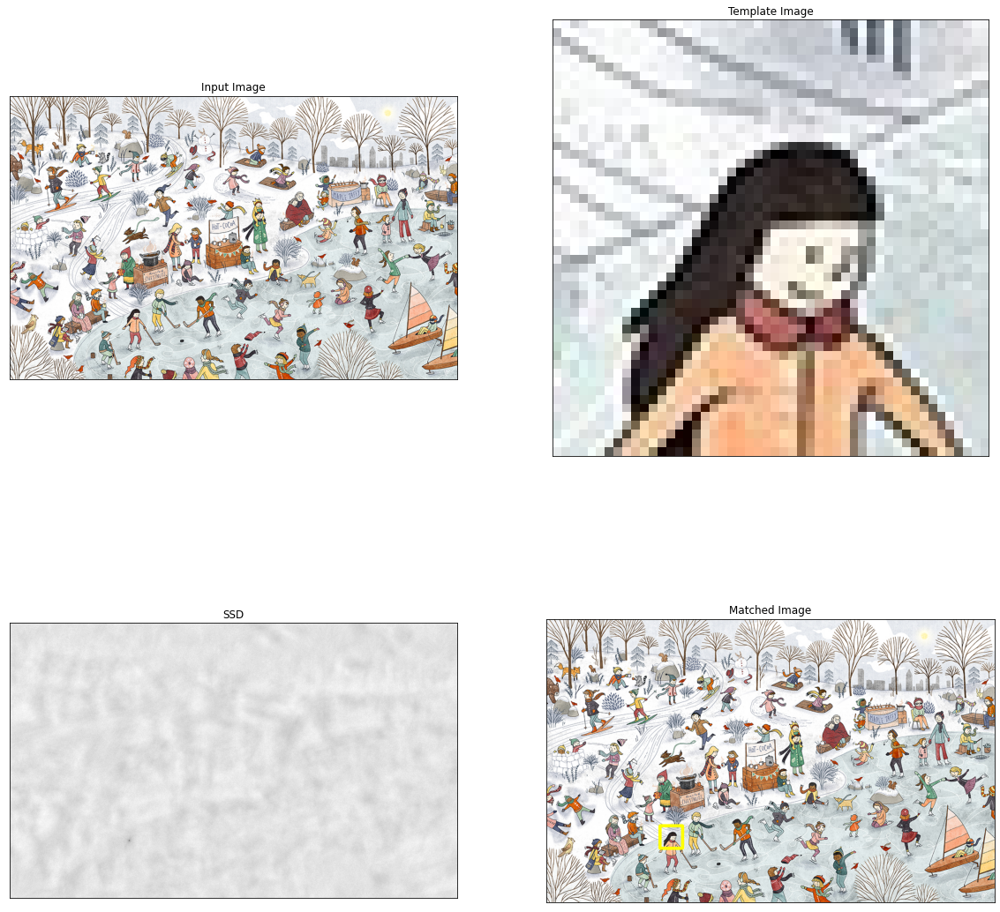

In [ ]:
res = SSD(festival_img, temp)

# https://docs.opencv.org/2.4/modules/core/doc/operations_on_arrays.html#void%20minMaxLoc(InputArray%20src,%20double*%20minVal,%20double*%20maxVal,%20Point*%20minLoc,%20Point*%20maxLoc,%20InputArray%20mask)
# Location where the SSD is a minimum
minVal, maxVal, minLoc, maxLoc = cv2.minMaxLoc(res)
print("minLoc: ", minLoc)
pt = minLoc

ht, wt = temp.shape[0:2]
cv2.rectangle(festival_img_disp, pt, (pt[0]+wt, pt[1]+ht), (255,255,0), 5) 

plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(festival_img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(222)
plt.imshow(temp)
plt.title("Template Image"), plt.xticks([]), plt.yticks([])
plt.subplot(223)
plt.imshow(res, cmap='gray')
plt.title("SSD"), plt.xticks([]), plt.yticks([])
plt.subplot(224)
plt.imshow(festival_img_disp)
plt.title("Matched Image"), plt.xticks([]), plt.yticks([])
plt.show()


## 4.3. Template Matching On Noisy Template




Shape of res:  (580, 943)
Type of res:  float32
minLoc:  (251, 459)


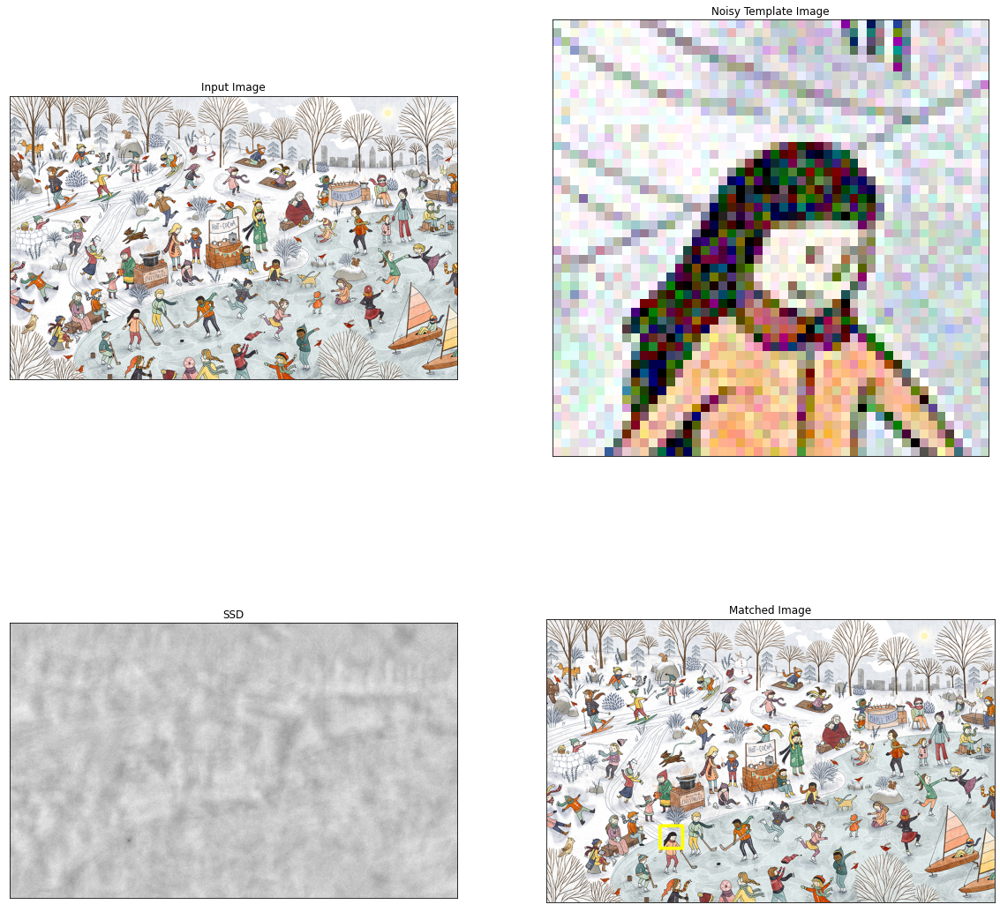

In [ ]:
# load noisy template image
temp_noisy = cv2.imread(path+"template_noisy.jpg")
temp_noisy = cv2.cvtColor(temp_noisy, cv2.COLOR_BGR2RGB)

# create copy of festival image
festival_img_disp = festival_img.copy()

res = SSD(festival_img, temp_noisy)

# https://docs.opencv.org/2.4/modules/core/doc/operations_on_arrays.html#void%20minMaxLoc(InputArray%20src,%20double*%20minVal,%20double*%20maxVal,%20Point*%20minLoc,%20Point*%20maxLoc,%20InputArray%20mask)
# Location where the SSD is a minimum
minVal, maxVal, minLoc, maxLoc = cv2.minMaxLoc(res)
print("minLoc: ", minLoc)
pt = minLoc

ht, wt = temp_noisy.shape[0:2]
cv2.rectangle(festival_img_disp, pt, (pt[0]+wt, pt[1]+ht), (255,255,0), 5) 

plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(festival_img)
plt.title("Input Image"), plt.xticks([]), plt.yticks([])
plt.subplot(222)
plt.imshow(temp_noisy)
plt.title("Noisy Template Image"), plt.xticks([]), plt.yticks([])
plt.subplot(223)
plt.imshow(res, cmap='gray')
plt.title("SSD"), plt.xticks([]), plt.yticks([])
plt.subplot(224)
plt.imshow(festival_img_disp)
plt.title("Matched Image"), plt.xticks([]), plt.yticks([])
plt.show()
